In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 9.4 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15756, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 15756 (delta 1), reused 11 (delta 1), pack-reused 15743 (from 1)
Receiving objects: 100% (15756/15756), 6.32 MiB | 17.60 MiB/s, done.
Resolving deltas: 100% (11497/11497), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your env

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.3 ; cuda:  cu121
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/Irrigation_Channel_Anomolies/training/labels_my-project-name_2024-08-21-03-59-05.json", "/content/drive/MyDrive/Irrigation_Channel_Anomolies/training")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/Irrigation_Channel_Anomolies/testing/labels_my-project-name_2024-08-21-03-30-47.json", "/content/drive/MyDrive/Irrigation_Channel_Anomolies/testing")



In [ ]:
train_metadata = MetadataCatalog.get("my_dataset_train")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train")

[08/21 10:39:48 d2.data.datasets.coco]: Loaded 12 images in COCO format from /content/drive/MyDrive/Irrigation_Channel_Anomolies/training/labels_my-project-name_2024-08-21-03-59-05.json


In [ ]:
from matplotlib import pyplot as plt

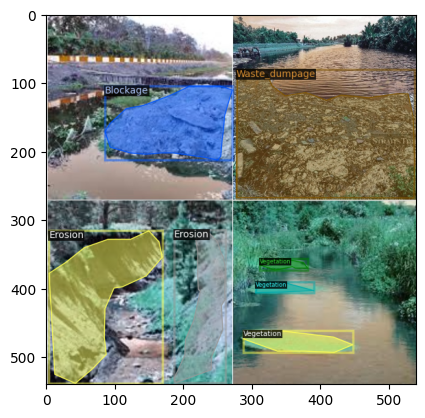

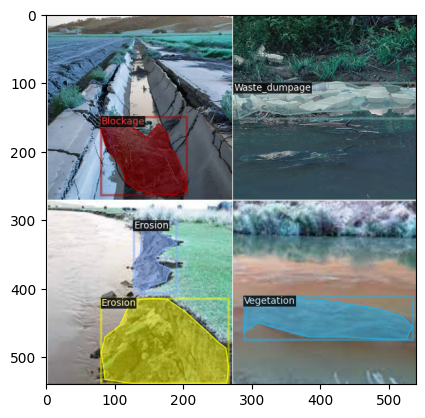

In [ ]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/Colab Notebooks/Model"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 1000 iterations seems good enough for this dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # We have 4 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available


[08/21 10:40:50 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 156MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [ ]:
trainer.train()

[08/21 10:40:57 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/21 10:41:09 d2.utils.events]:  eta: 0:06:18  iter: 19  total_loss: 2.928  loss_cls: 1.659  loss_box_reg: 0.1229  loss_mask: 0.6928  loss_rpn_cls: 0.4279  loss_rpn_loc: 0.0439    time: 0.4111  last_time: 0.3256  data_time: 0.0800  last_data_time: 0.0049   lr: 4.9953e-06  max_mem: 1770M
[08/21 10:41:21 d2.utils.events]:  eta: 0:05:42  iter: 39  total_loss: 2.9  loss_cls: 1.542  loss_box_reg: 0.2597  loss_mask: 0.692  loss_rpn_cls: 0.3676  loss_rpn_loc: 0.05074    time: 0.3807  last_time: 0.3544  data_time: 0.0070  last_data_time: 0.0051   lr: 9.9902e-06  max_mem: 1770M
[08/21 10:41:28 d2.utils.events]:  eta: 0:05:26  iter: 59  total_loss: 2.592  loss_cls: 1.355  loss_box_reg: 0.2174  loss_mask: 0.6903  loss_rpn_cls: 0.2852  loss_rpn_loc: 0.0488    time: 0.3716  last_time: 0.3156  data_time: 0.0078  last_data_time: 0.0057   lr: 1.4985e-05  max_mem: 1770M
[08/21 10:41:35 d2.utils.events]:  eta: 0:05:19  iter: 79  total_loss: 2.391  loss_cls: 1.112  loss_box_reg: 0.3738  loss_mask: 0.68

In [ ]:
import yaml
# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/Waste_Trackin/config.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

In [ ]:
trainer.save_model("/content/drive/MyDrive/Waste_Trackin/model_weights.pth")

AttributeError: 'DefaultTrainer' object has no attribute 'save_model'

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[08/21 10:50:44 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/Colab Notebooks/Model/model_final.pth ...


In [ ]:
val_metadata = MetadataCatalog.get("my_dataset_val")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")

[08/21 10:50:47 d2.data.datasets.coco]: Loaded 3 images in COCO format from /content/drive/MyDrive/Irrigation_Channel_Anomolies/testing/labels_my-project-name_2024-08-21-03-30-47.json


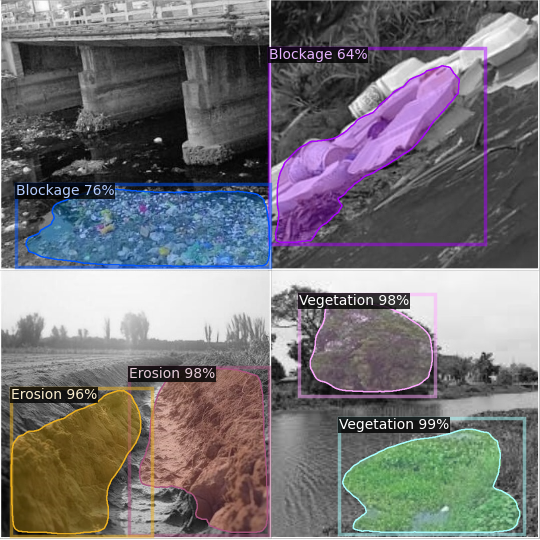

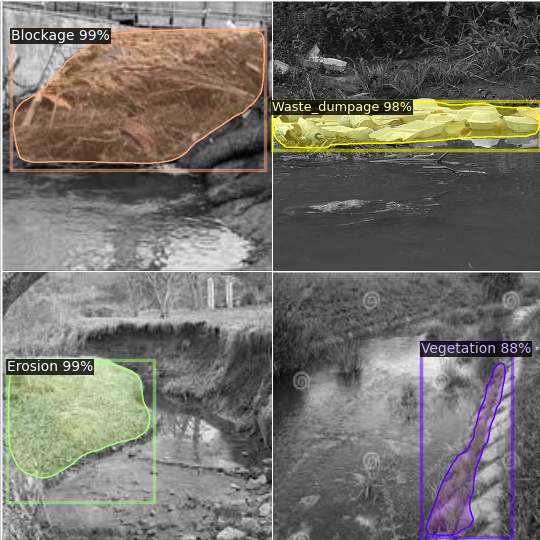

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 2):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
import torch

# Assuming 'cfg' is your Detectron2 config and 'trainer' is the DefaultTrainer object
model = trainer.model

# Save the model's weights
torch.save(model.state_dict(), "/content/drive/MyDrive/Irrigation_Channel_Anomolies/irrigation_model_weights.pth")

# Save the config
with open("/content/drive/MyDrive/Irrigation_Channel_Anomolies/irrigation_config.yaml", "w") as f:
    f.write(cfg.dump())


[08/21 11:23:33 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/Irrigation_Channel_Anomolies/irrigation_model_weights.pth ...


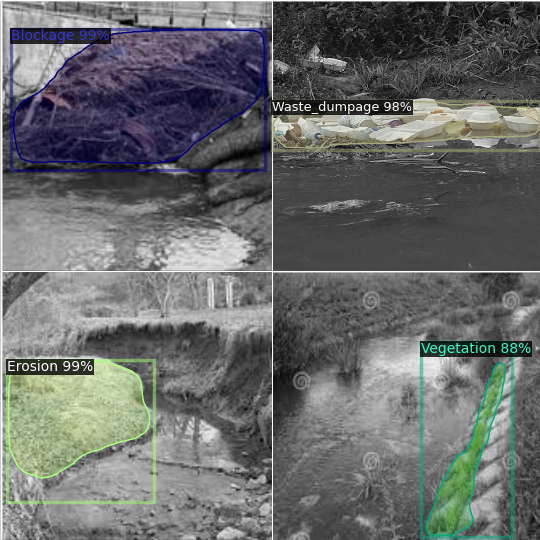

In [ ]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
import torch

# Load the config
cfg = get_cfg()
cfg.merge_from_file("/content/drive/MyDrive/Irrigation_Channel_Anomolies/irrigation_config.yaml")
cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/Irrigation_Channel_Anomolies/irrigation_model_weights.pth"  # path to the saved model weights
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set a threshold for this model

# Initialize the model
predictor = DefaultPredictor(cfg)

for d in random.sample(val_dataset_dicts, 1):    #select number of images for display
    image = cv2.imread(d["file_name"])

# Now you can use `predictor` for inference on new images
output = predictor(image)  # `image` should be a NumPy array, BGR format as used by OpenCV
v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])



In [ ]:
cfg1 = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg1.merge_from_file("/content/drive/MyDrive/Pavement_Detection/config.yaml")
cfg1.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg1.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("/content/drive/MyDrive/Pavement_Detection/config.yaml")
predictor = DefaultPredictor(cfg1)
outputs = predictor(im)

RuntimeError: Pretrained model for /content/drive/MyDrive/Pavement_Detection/config.yaml is not available!